In [2]:
import os
import numpy as np
import torch
import matplotlib.pyplot as plt
from PIL import Image

if torch.cuda.is_available():
    device = torch.device("cuda")
elif torch.backends.mps.is_available():
    device = torch.device("mps")
else:
    device = torch.device("cpu")
print(f"using device: {device}")

# select the device for computation
if torch.cuda.is_available():
    device = torch.device("cuda")
elif torch.backends.mps.is_available():
    device = torch.device("mps")
else:
    device = torch.device("cpu")
print(f"using device: {device}")

if device.type == "cuda":
    # use bfloat16 for the entire notebook
    torch.autocast("cuda", dtype=torch.bfloat16).__enter__()
    # turn on tfloat32 for Ampere GPUs (https://pytorch.org/docs/stable/notes/cuda.html#tensorfloat-32-tf32-on-ampere-devices)
    if torch.cuda.get_device_properties(0).major >= 8:
        torch.backends.cuda.matmul.allow_tf32 = True
        torch.backends.cudnn.allow_tf32 = True
elif device.type == "mps":
    print(
        "\nSupport for MPS devices is preliminary. SAM 2 is trained with CUDA and might "
        "give numerically different outputs and sometimes degraded performance on MPS. "
        "See e.g. https://github.com/pytorch/pytorch/issues/84936 for a discussion."
    )

np.random.seed(3)

using device: cuda
using device: cuda


In [3]:
def show_mask(mask, ax, random_color=False, borders = True):
    if random_color:
        color = np.concatenate([np.random.random(3), np.array([0.6])], axis=0)
    else:
        color = np.array([30/255, 144/255, 255/255, 0.6])
    h, w = mask.shape[-2:]
    mask = mask.astype(np.uint8)
    mask_image =  mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    if borders:
        import cv2
        contours, _ = cv2.findContours(mask,cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE) 
        # Try to smooth contours
        contours = [cv2.approxPolyDP(contour, epsilon=0.01, closed=True) for contour in contours]
        mask_image = cv2.drawContours(mask_image, contours, -1, (1, 1, 1, 0.5), thickness=2) 
    ax.imshow(mask_image)

def show_points(coords, labels, ax, marker_size=375):
    pos_points = coords[labels==1]
    neg_points = coords[labels==0]
    ax.scatter(pos_points[:, 0], pos_points[:, 1], color='green', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)
    ax.scatter(neg_points[:, 0], neg_points[:, 1], color='red', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)   

def show_box(box, ax):
    x0, y0 = box[0], box[1]
    w, h = box[2] - box[0], box[3] - box[1]
    ax.add_patch(plt.Rectangle((x0, y0), w, h, edgecolor='green', facecolor=(0, 0, 0, 0), lw=2))    

def show_masks(image, masks, scores, point_coords=None, box_coords=None, input_labels=None, borders=True):
    for i, (mask, score) in enumerate(zip(masks, scores)):
        plt.figure(figsize=(10, 10))
        plt.imshow(image)
        show_mask(mask, plt.gca(), borders=borders)
        if point_coords is not None:
            assert input_labels is not None
            show_points(point_coords, input_labels, plt.gca())
        if box_coords is not None:
            # boxes
            show_box(box_coords, plt.gca())
        if len(scores) > 1:
            plt.title(f"Mask {i+1}, Score: {score:.3f}", fontsize=18)
        plt.axis('off')
        plt.show()

In [4]:
image = Image.open('data/country_1/images/country1_000014.jpg')
image = np.array(image.convert("RGB"))

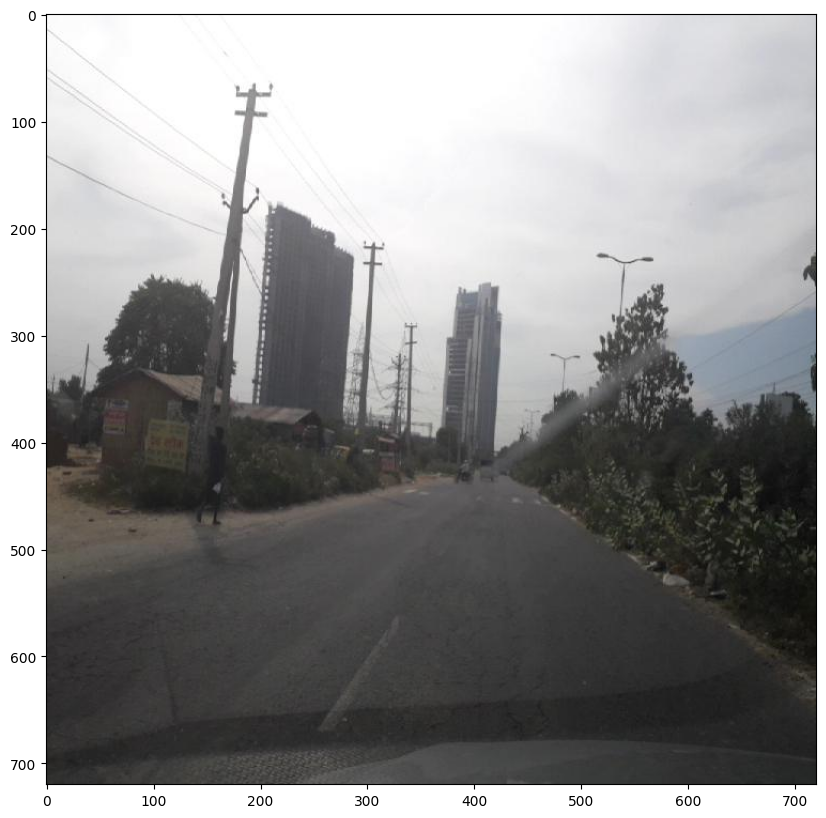

In [5]:
plt.figure(figsize=(10, 10))
plt.imshow(image)
plt.axis('on')
plt.show()

In [7]:
from sam2.build_sam import build_sam2
from sam2.sam2_image_predictor import SAM2ImagePredictor

sam2_checkpoint = "sam_checkpoints/sam2.1_hiera_large.pt"
model_cfg = "configs/sam2.1/sam2.1_hiera_l.yaml"

sam2_model = build_sam2(model_cfg, sam2_checkpoint, device=device)

predictor = SAM2ImagePredictor(sam2_model)

In [9]:
predictor.set_image(image)

In [10]:
# find center point of image
h, w = image.shape[:2]
input_point = np.array([[w // 2, h - h // 4]])

# input_point = np.array([[500, 375]])
input_label = np.array([1])

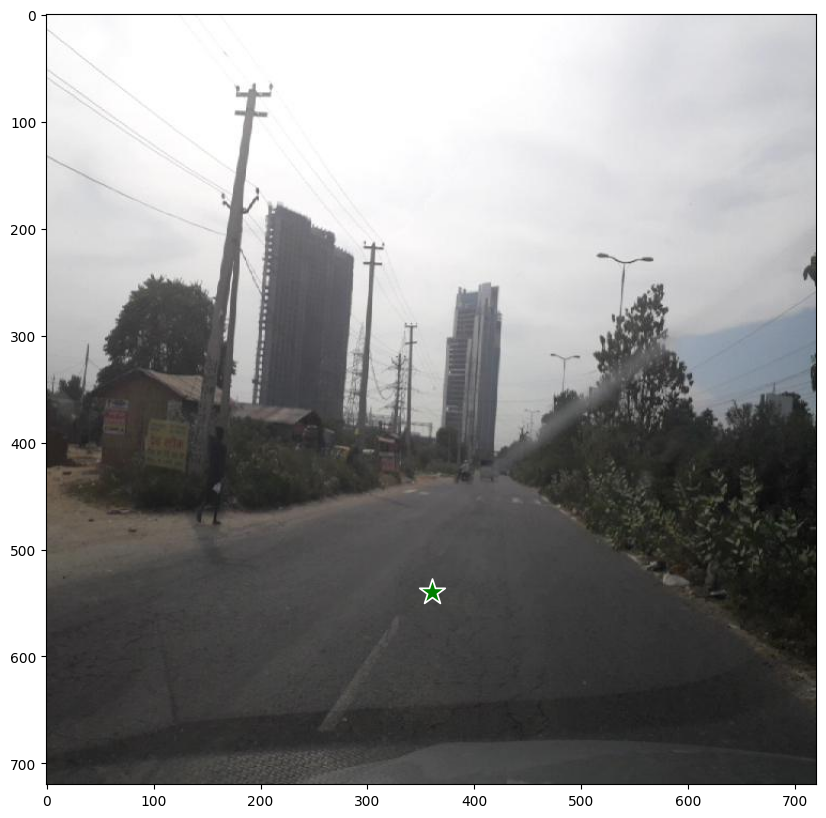

In [11]:
plt.figure(figsize=(10, 10))
plt.imshow(image)
show_points(input_point, input_label, plt.gca())
plt.axis('on')
plt.show()  

In [12]:
print(predictor._features["image_embed"].shape, predictor._features["image_embed"][-1].shape)

torch.Size([1, 256, 64, 64]) torch.Size([256, 64, 64])


In [13]:
masks, scores, logits = predictor.predict(
    point_coords=input_point,
    point_labels=input_label,
    multimask_output=True,
)
sorted_ind = np.argsort(scores)[::-1]
masks = masks[sorted_ind]
scores = scores[sorted_ind]
logits = logits[sorted_ind]

In [14]:
masks.shape  # (number_of_masks) x H x W

(3, 720, 720)

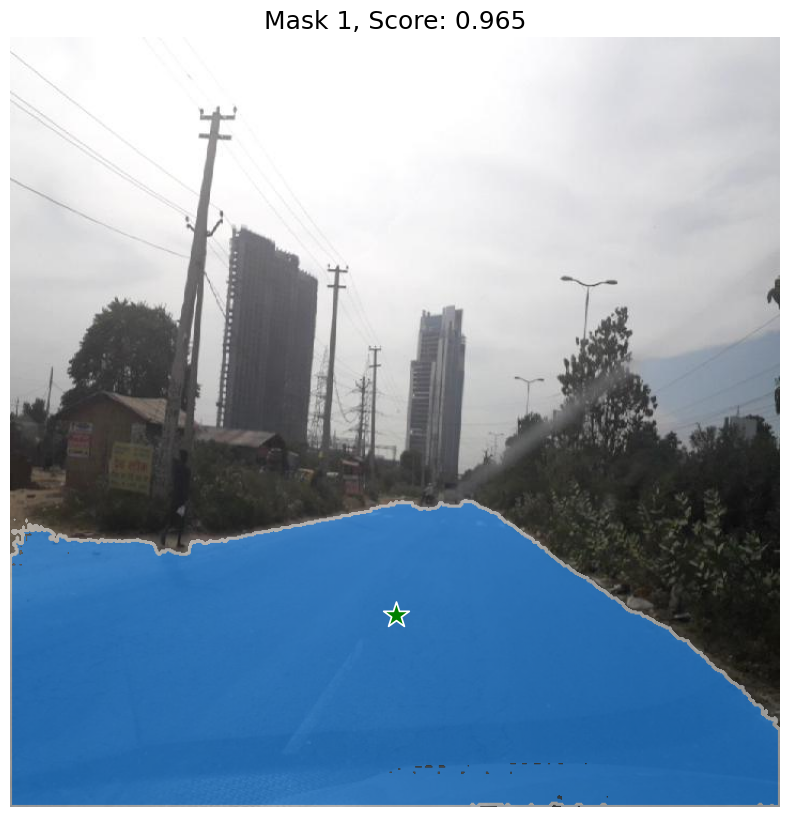

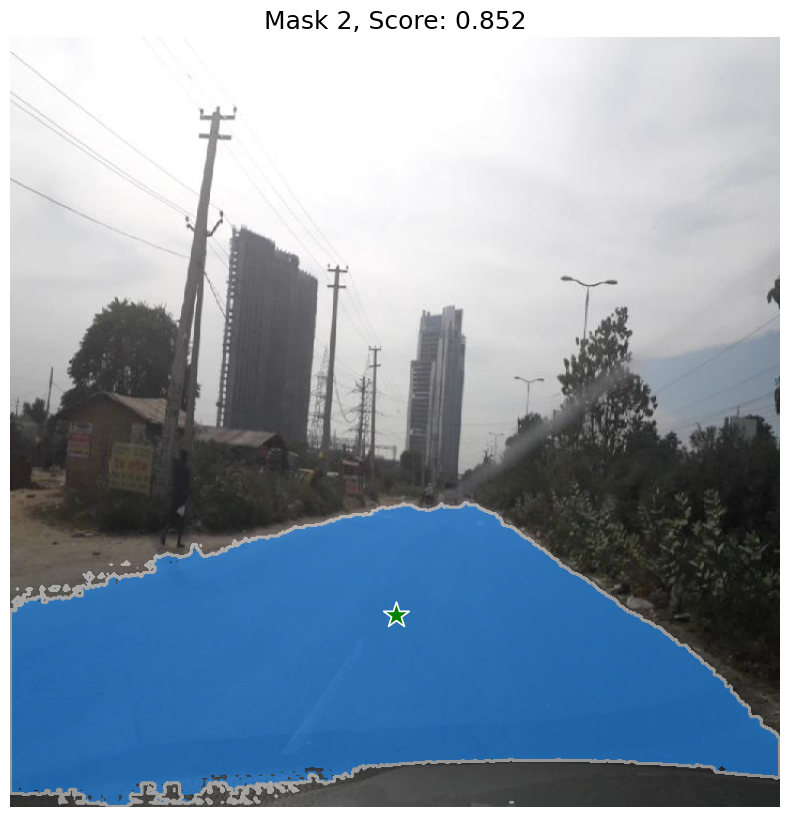

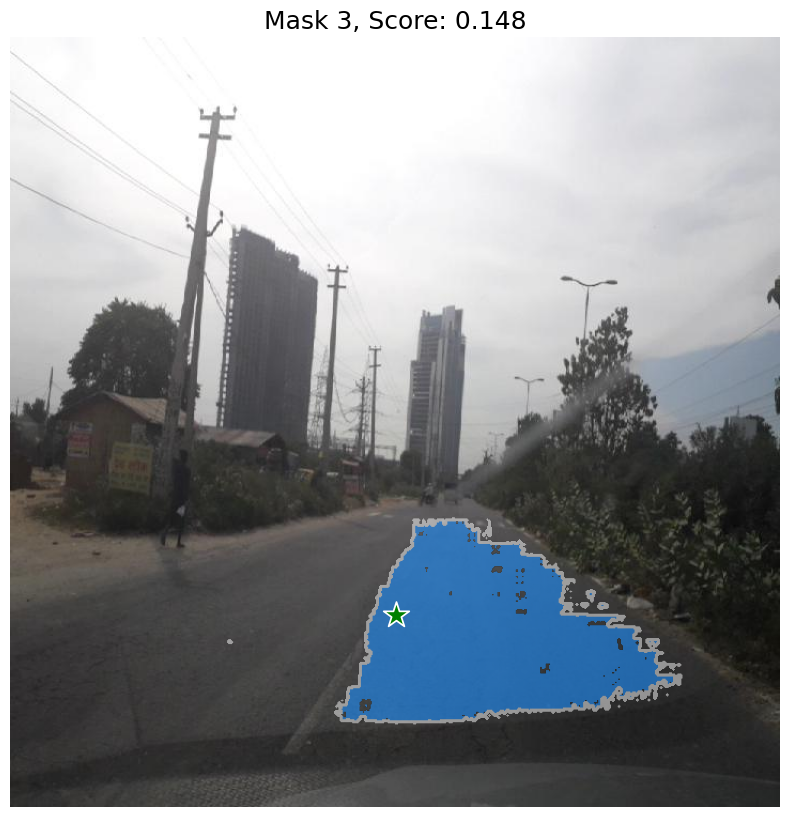

In [15]:
show_masks(image, masks, scores, point_coords=input_point, input_labels=input_label, borders=True)

# Batch SAM Segmentation on Dataset

Now we'll extend the SAM segmentation to work with multiple images from our dataset. We'll:

1. Load the dataset using the same approach as in `bounding_box_visualization.ipynb`
2. Apply SAM segmentation to multiple images from different countries
3. Visualize the segmentation results alongside the original images
4. Compare segmentation results across different road damage types

This will help us understand how well SAM performs on various road damage scenarios across different regions.

In [16]:
import glob
import random

def load_dataset(data_dir):
    """
    Load dataset from all country directories
    Returns: list of dictionaries with image_path, label_path, and bounding boxes
    """
    dataset = []

    # Get all country directories
    country_dirs = [d for d in os.listdir(data_dir) if d.startswith('country_')]

    for country_dir in country_dirs:
        country_path = os.path.join(data_dir, country_dir)
        images_path = os.path.join(country_path, 'images')
        labels_path = os.path.join(country_path, 'labels')

        # Get all image files
        image_files = glob.glob(os.path.join(images_path, '*.jpg'))

        for image_file in image_files:
            # Get corresponding label file
            base_name = os.path.splitext(os.path.basename(image_file))[0]
            label_file = os.path.join(labels_path, f"{base_name}.txt")

            if os.path.exists(label_file):
                # Read bounding boxes from label file
                bboxes = []
                with open(label_file, 'r') as f:
                    for line in f:
                        line = line.strip()
                        if line:
                            parts = line.split()
                            if len(parts) == 5:
                                class_id = int(parts[0])
                                x_center = float(parts[1])
                                y_center = float(parts[2])
                                width = float(parts[3])
                                height = float(parts[4])
                                bboxes.append(
                                    {
                                        'class_id': class_id,
                                        'x_center': x_center,
                                        'y_center': y_center,
                                        'width': width,
                                        'height': height,
                                    }
                                )

                dataset.append(
                    {'image_path': image_file, 'label_path': label_file, 'bboxes': bboxes, 'country': country_dir}
                )

    return dataset

# Define class names for road damage types
class_names = {
    0: 'Pothole',
    1: 'Alligator Crack',
    2: 'Transverse Crack',
    3: 'Longitudinal Crack',
}

# Load the dataset
data_dir = "data"
dataset = load_dataset(data_dir)
print(f"Total samples loaded: {len(dataset)}")

# Filter samples with bounding boxes
samples_with_bboxes = [sample for sample in dataset if len(sample['bboxes']) > 0]
print(f"Samples with bounding boxes: {len(samples_with_bboxes)}")

# Show class distribution
class_counts = {}
for sample in samples_with_bboxes:
    for bbox in sample['bboxes']:
        class_id = bbox['class_id']
        class_counts[class_id] = class_counts.get(class_id, 0) + 1

print(f"\nClass distribution:")
for class_id, count in sorted(class_counts.items()):
    class_name = class_names.get(class_id, f"Class {class_id}")
    print(f"  {class_name}: {count}")

Total samples loaded: 6039
Samples with bounding boxes: 6039

Class distribution:
  Pothole: 3425
  Alligator Crack: 3582
  Transverse Crack: 4280
  Longitudinal Crack: 4951


In [17]:
def convert_yolo_to_bbox(x_center, y_center, width, height, img_width, img_height):
    """
    Convert YOLO format (normalized) to bounding box coordinates
    """
    x_min = (x_center - width / 2) * img_width
    y_min = (y_center - height / 2) * img_height
    x_max = (x_center + width / 2) * img_width
    y_max = (y_center + height / 2) * img_height
    return x_min, y_min, x_max, y_max

def segment_image_with_sam(image_path, predictor, strategy='center'):
    """
    Apply SAM segmentation to an image using different strategies
    
    Args:
        image_path: Path to the image
        predictor: SAM2ImagePredictor instance
        strategy: 'center', 'bottom_center', or 'random'
    
    Returns:
        image, masks, scores, input_point
    """
    # Load image
    image = Image.open(image_path)
    image = np.array(image.convert("RGB"))
    
    # Set image for predictor
    predictor.set_image(image)
    
    # Get image dimensions
    h, w = image.shape[:2]
    
    # Define input point based on strategy
    if strategy == 'center':
        input_point = np.array([[w // 2, h // 2]])
    elif strategy == 'bottom_center':
        input_point = np.array([[w // 2, h - h // 4]])
    elif strategy == 'random':
        input_point = np.array([[np.random.randint(w//4, 3*w//4), 
                                np.random.randint(h//4, 3*h//4)]])
    else:
        # Default to center
        input_point = np.array([[w // 2, h // 2]])
    
    input_label = np.array([1])
    
    # Get predictions
    masks, scores, logits = predictor.predict(
        point_coords=input_point,
        point_labels=input_label,
        multimask_output=True,
    )
    
    # Sort by score
    sorted_ind = np.argsort(scores)[::-1]
    masks = masks[sorted_ind]
    scores = scores[sorted_ind]
    
    return image, masks, scores, input_point, input_label

def visualize_sam_results(image, masks, scores, input_point, input_label, sample_info, max_masks=3):
    """
    Visualize SAM segmentation results
    """
    n_masks = min(len(masks), max_masks)
    
    fig, axes = plt.subplots(1, n_masks + 1, figsize=(20, 5))
    
    # Show original image
    axes[0].imshow(image)
    show_points(input_point, input_label, axes[0])
    axes[0].set_title(f"Original Image\n{os.path.basename(sample_info['image_path'])}\n{sample_info['country']}")
    axes[0].axis('off')
    
    # Show segmentation results
    for i in range(n_masks):
        axes[i + 1].imshow(image)
        show_mask(masks[i], axes[i + 1], borders=True)
        show_points(input_point, input_label, axes[i + 1])
        axes[i + 1].set_title(f"Mask {i+1}\nScore: {scores[i]:.3f}")
        axes[i + 1].axis('off')
    
    plt.tight_layout()
    plt.show()

print("SAM segmentation functions created successfully!")

SAM segmentation functions created successfully!


=== SAM Segmentation on Random Dataset Samples ===

Processing sample 1/4: country3_001292.jpg
Country: country_3, Bounding boxes: 5


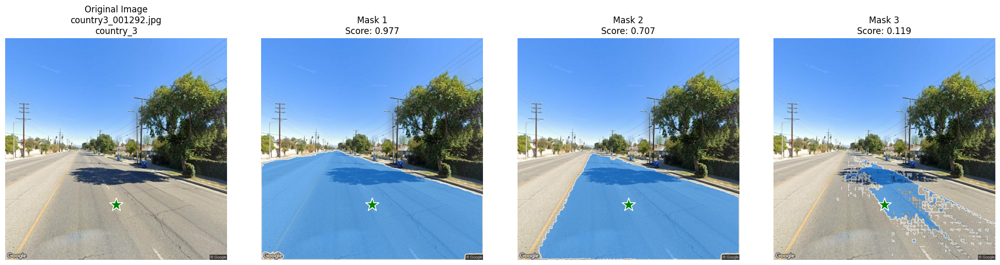


Processing sample 2/4: country1_001156.jpg
Country: country_1, Bounding boxes: 6


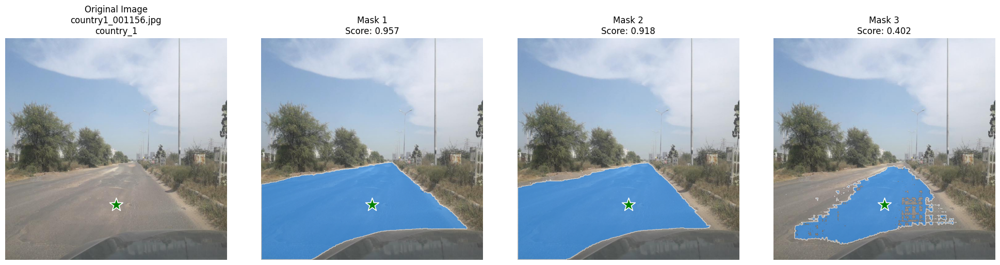


Processing sample 3/4: country2_008765.jpg
Country: country_2, Bounding boxes: 2


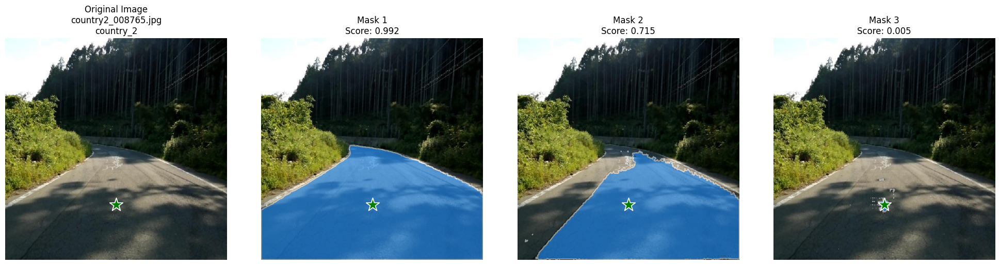


Processing sample 4/4: country1_008684.jpg
Country: country_1, Bounding boxes: 2


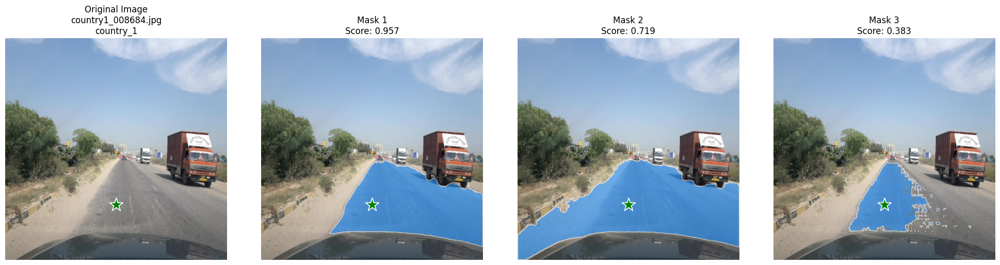

In [ ]:
# Segment random samples from the dataset
print("=== SAM Segmentation on Random Dataset Samples ===")

# Select random samples for segmentation
n_samples = 4
random_samples = random.sample(samples_with_bboxes, min(n_samples, len(samples_with_bboxes)))

for i, sample in enumerate(random_samples):
    print(f"\nProcessing sample {i+1}/{len(random_samples)}: {os.path.basename(sample['image_path'])}")
    print(f"Country: {sample['country']}, Bounding boxes: {len(sample['bboxes'])}")
    
    # Apply SAM segmentation
    image, masks, scores, input_point, input_label = segment_image_with_sam(
        sample['image_path'], predictor, strategy='bottom_center'
    )
    
    # Visualize results
    visualize_sam_results(image, masks, scores, input_point, input_label, sample)


=== SAM Segmentation by Damage Class ===

--- Analyzing Pothole (Class 0) ---

Processing Pothole sample 1: country2_010843.jpg
  Using center strategy...


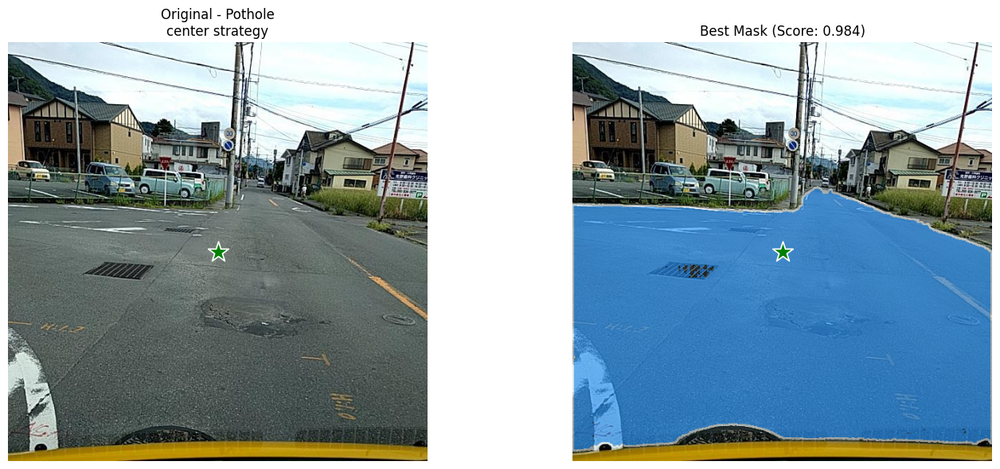

  Using bottom_center strategy...


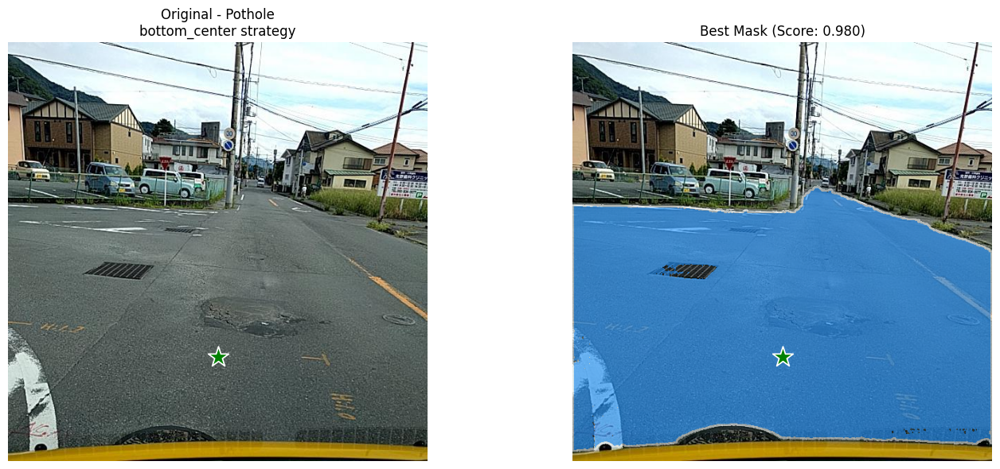


Processing Pothole sample 2: country2_001861.jpg
  Using center strategy...


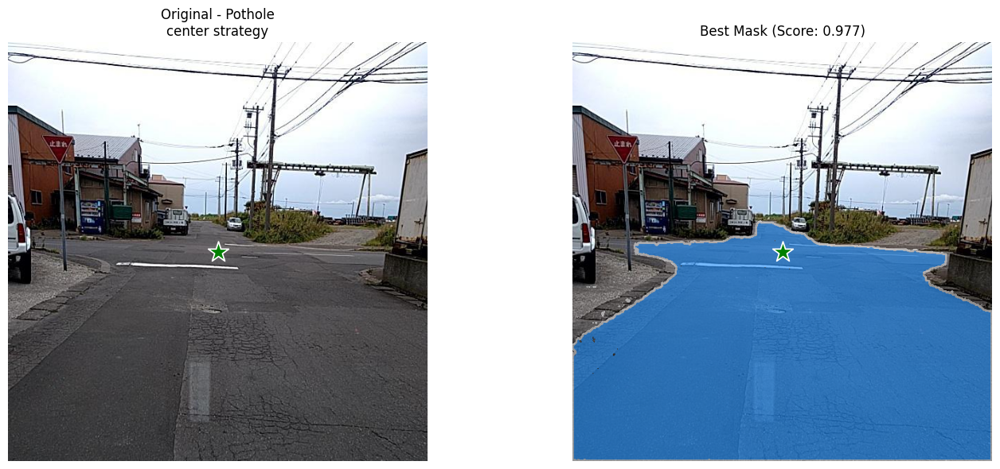

  Using bottom_center strategy...


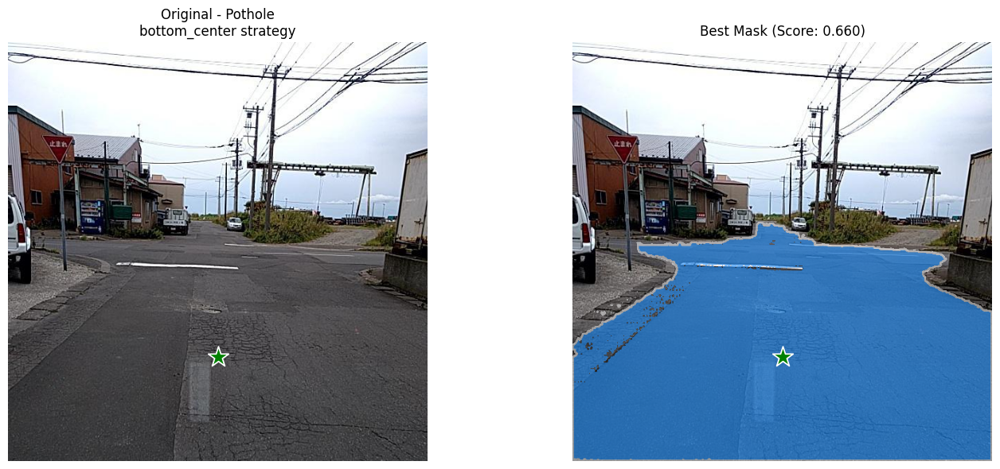


--- Analyzing Alligator Crack (Class 1) ---

Processing Alligator Crack sample 1: country2_007825.jpg
  Using center strategy...


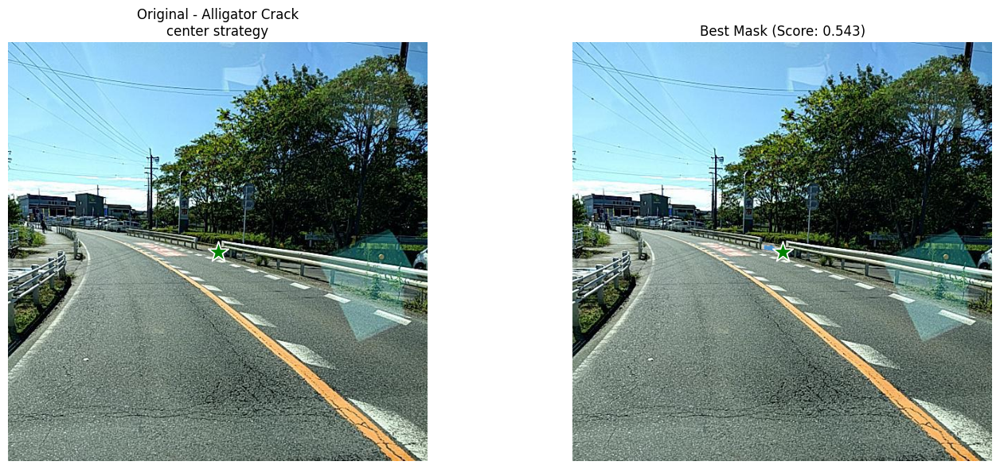

  Using bottom_center strategy...


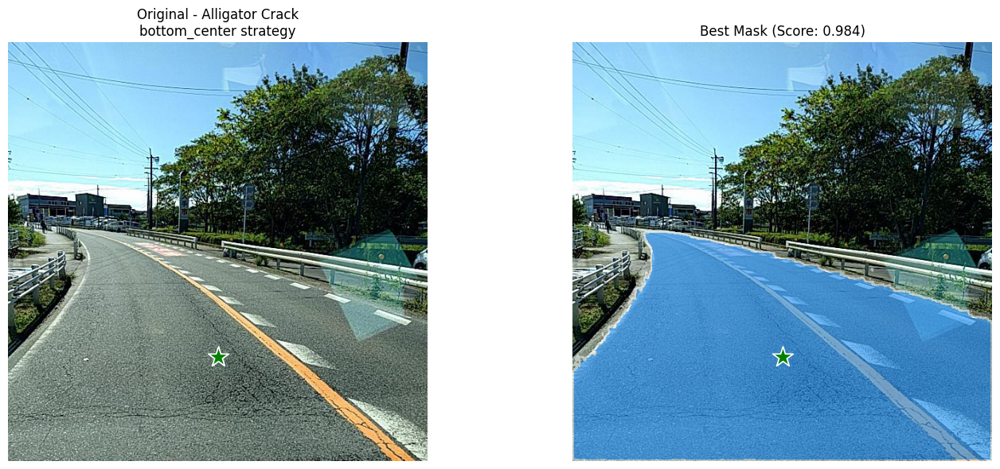


Processing Alligator Crack sample 2: country2_010650.jpg
  Using center strategy...


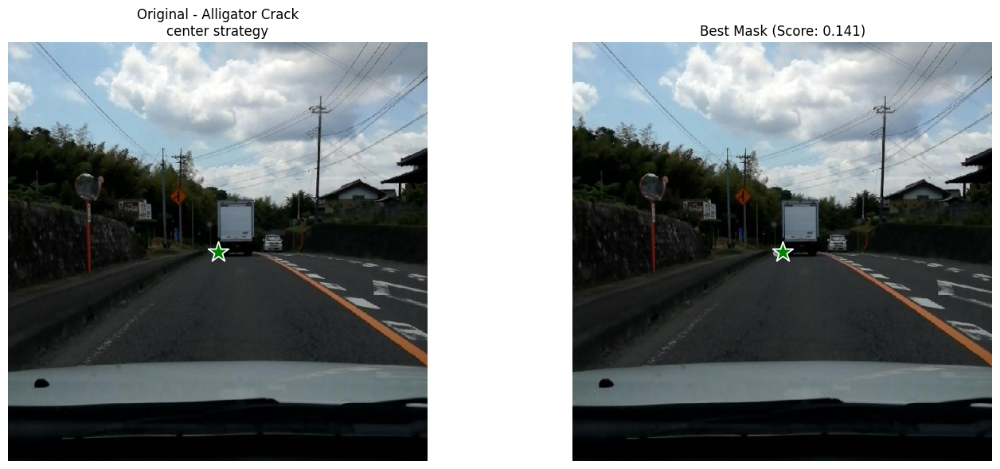

  Using bottom_center strategy...


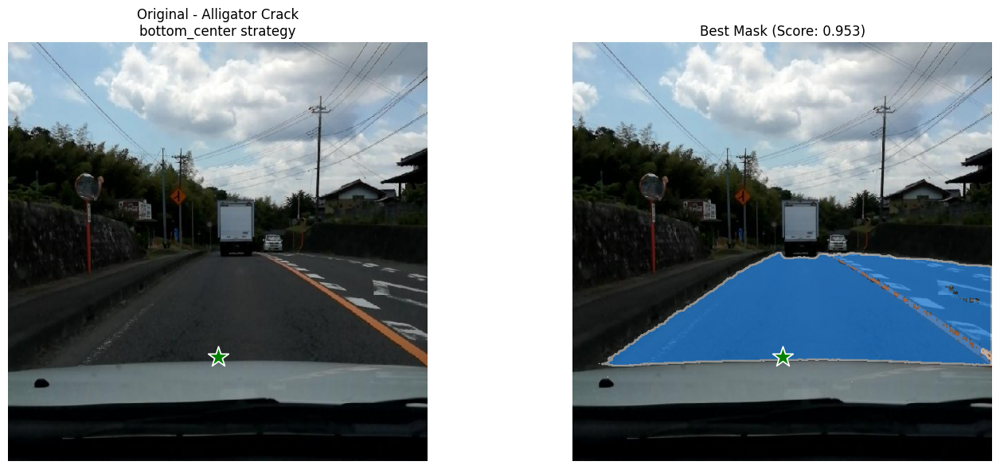


--- Analyzing Transverse Crack (Class 2) ---

Processing Transverse Crack sample 1: country2_012942.jpg
  Using center strategy...


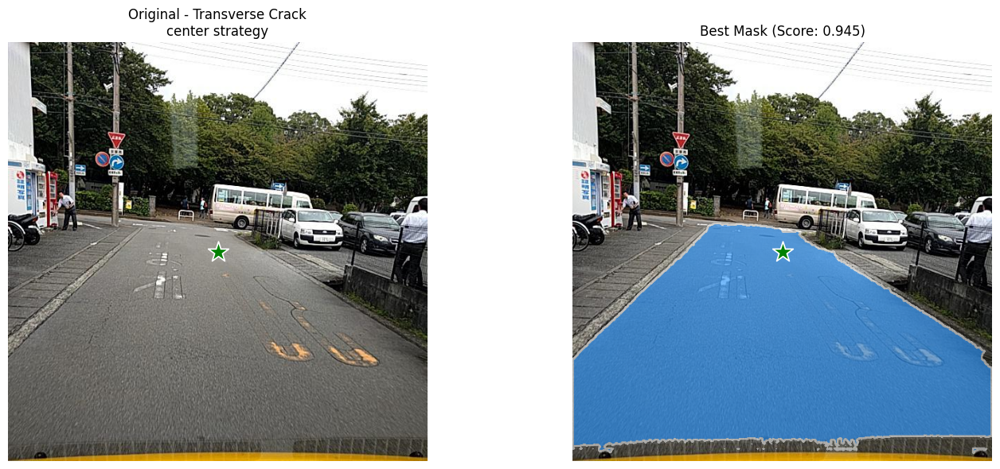

  Using bottom_center strategy...


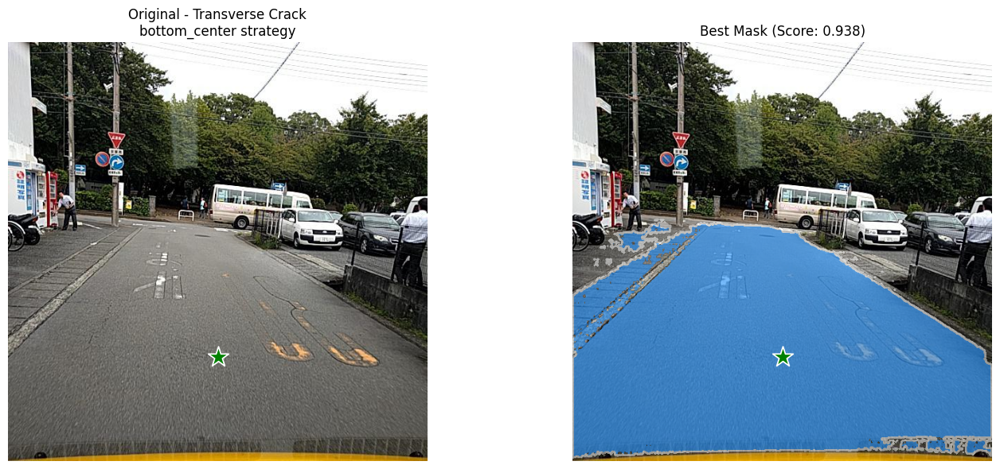


Processing Transverse Crack sample 2: country2_007825.jpg
  Using center strategy...


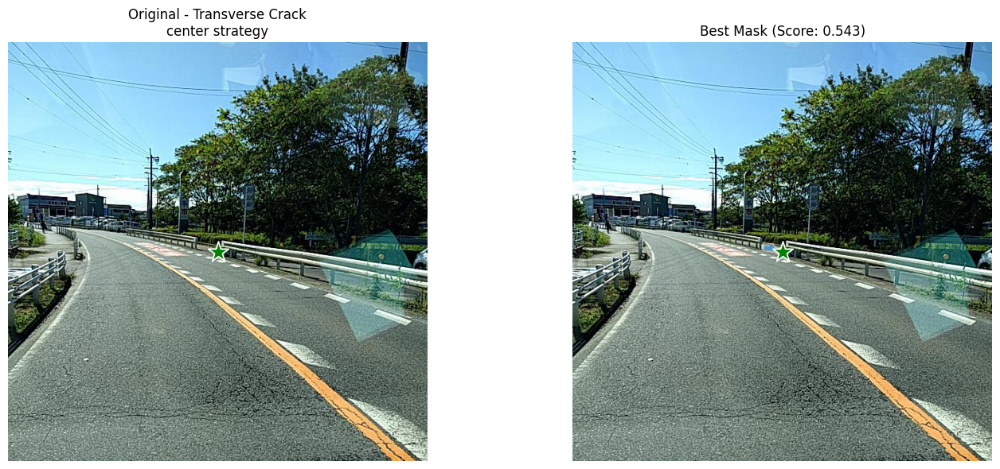

  Using bottom_center strategy...


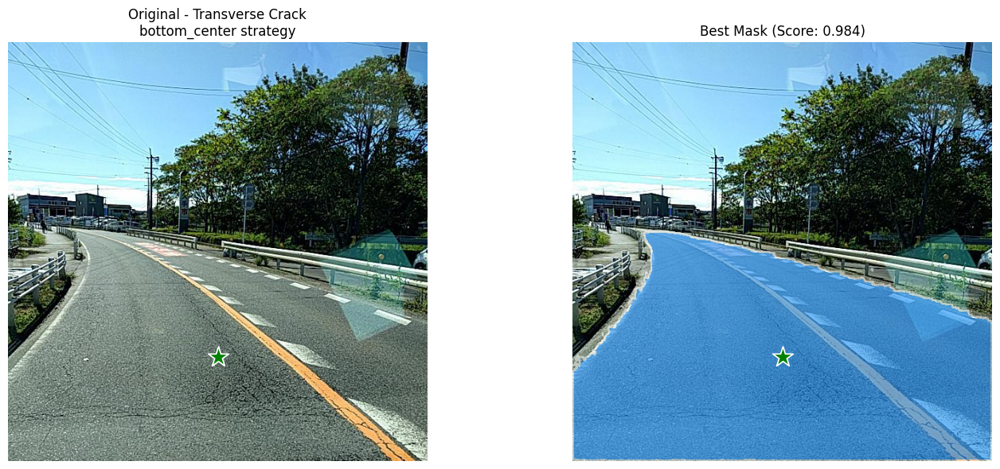


--- Analyzing Longitudinal Crack (Class 3) ---

Processing Longitudinal Crack sample 1: country2_012942.jpg
  Using center strategy...


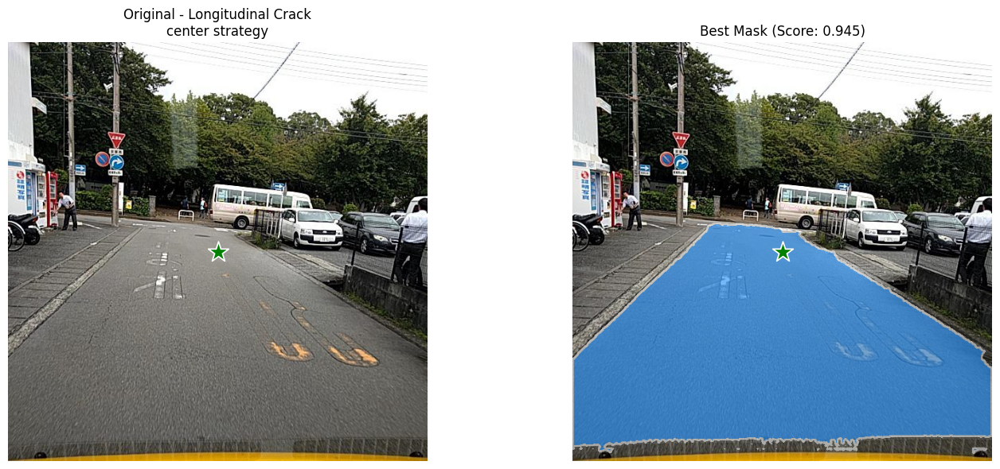

  Using bottom_center strategy...


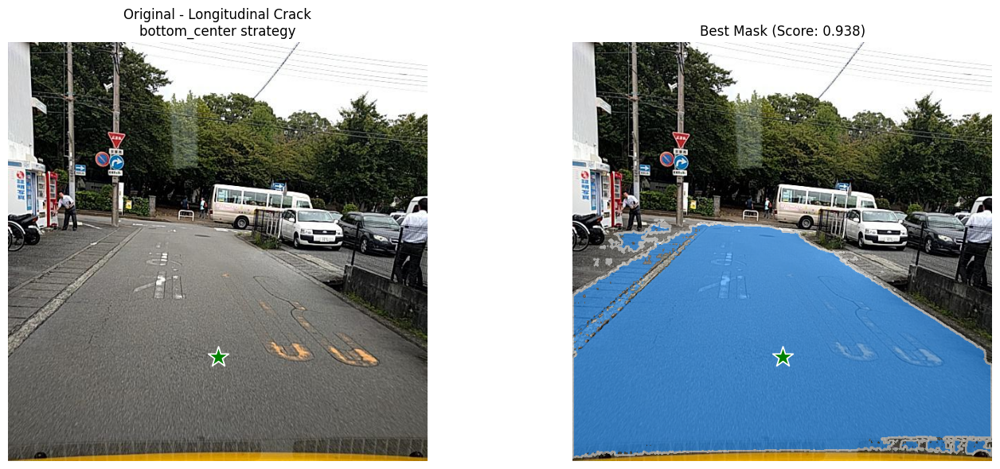


Processing Longitudinal Crack sample 2: country2_009942.jpg
  Using center strategy...


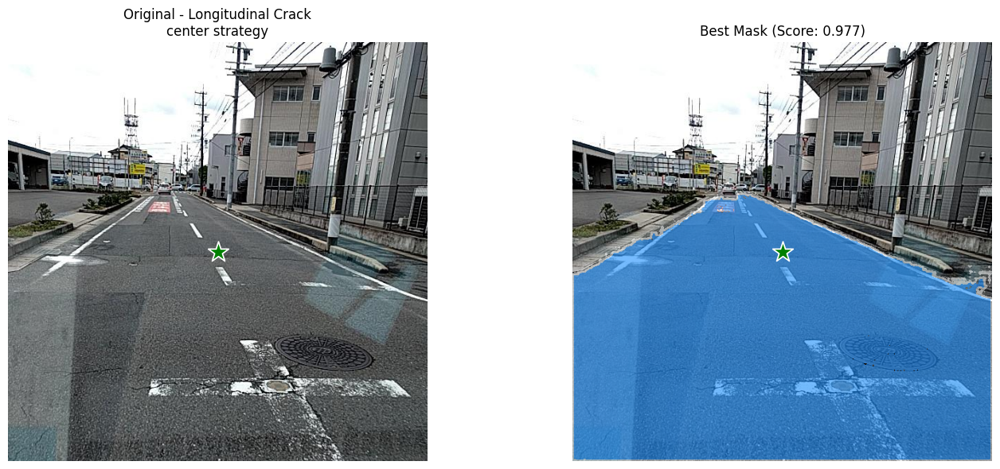

  Using bottom_center strategy...


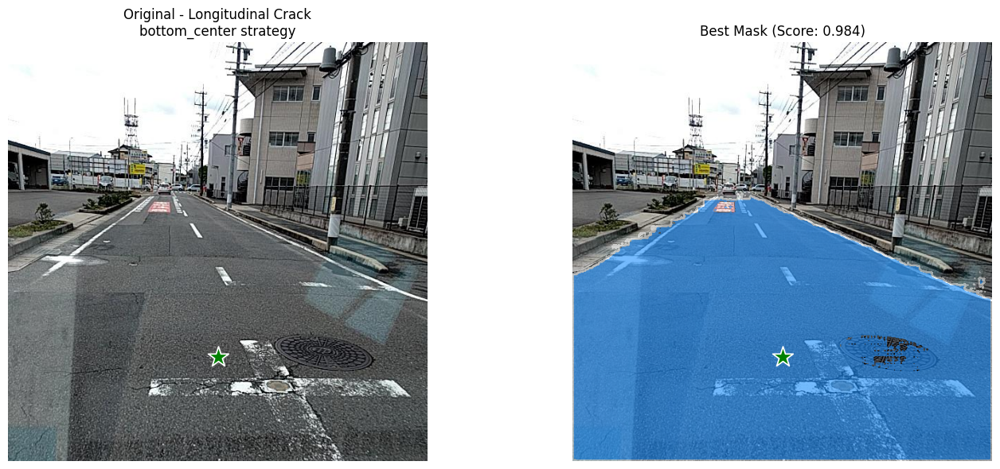

In [19]:
# Segment samples by damage class
print("\n=== SAM Segmentation by Damage Class ===")

def get_samples_by_class(dataset, target_class_id, max_samples=2):
    """Get samples that contain a specific class"""
    samples = []
    for sample in dataset:
        if any(bbox['class_id'] == target_class_id for bbox in sample['bboxes']):
            samples.append(sample)
        if len(samples) >= max_samples:
            break
    return samples

# Analyze each damage class
for class_id in sorted(class_counts.keys()):
    class_name = class_names.get(class_id, f"Class {class_id}")
    print(f"\n--- Analyzing {class_name} (Class {class_id}) ---")
    
    class_samples = get_samples_by_class(samples_with_bboxes, class_id, max_samples=2)
    
    if class_samples:
        for j, sample in enumerate(class_samples):
            print(f"\nProcessing {class_name} sample {j+1}: {os.path.basename(sample['image_path'])}")
            
            # Apply SAM segmentation with different strategies
            strategies = ['center', 'bottom_center']
            
            for strategy in strategies:
                print(f"  Using {strategy} strategy...")
                
                try:
                    image, masks, scores, input_point, input_label = segment_image_with_sam(
                        sample['image_path'], predictor, strategy=strategy
                    )
                    
                    # Show only the best mask for comparison
                    fig, axes = plt.subplots(1, 2, figsize=(15, 6))
                    
                    # Original image
                    axes[0].imshow(image)
                    show_points(input_point, input_label, axes[0])
                    axes[0].set_title(f"Original - {class_name}\n{strategy} strategy")
                    axes[0].axis('off')
                    
                    # Best segmentation mask
                    axes[1].imshow(image)
                    show_mask(masks[0], axes[1], borders=True)
                    show_points(input_point, input_label, axes[1])
                    axes[1].set_title(f"Best Mask (Score: {scores[0]:.3f})")
                    axes[1].axis('off')
                    
                    plt.tight_layout()
                    plt.show()
                    
                except Exception as e:
                    print(f"    Error processing with {strategy}: {e}")
    else:
        print(f"No samples found for {class_name}")

In [20]:
# Compare segmentation across different countries
print("\n=== SAM Segmentation Comparison Across Countries ===")

def get_samples_by_country(dataset, country, max_samples=2):
    """Get samples from a specific country"""
    samples = [sample for sample in dataset if sample['country'] == country]
    return samples[:max_samples]

# Get country statistics
country_counts = {}
for sample in samples_with_bboxes:
    country = sample['country']
    country_counts[country] = country_counts.get(country, 0) + 1

print("Country distribution:")
for country, count in sorted(country_counts.items()):
    print(f"  {country}: {count} samples")

# Compare segmentation results across countries
countries = sorted(country_counts.keys())
for country in countries:
    print(f"\n--- {country.upper()} ---")
    
    country_samples = get_samples_by_country(samples_with_bboxes, country, max_samples=1)
    
    if country_samples:
        sample = country_samples[0]
        print(f"Processing: {os.path.basename(sample['image_path'])}")
        print(f"Damage types in image: {[class_names.get(bbox['class_id'], f'Class {bbox[\"class_id\"]}') for bbox in sample['bboxes']]}")
        
        try:
            image, masks, scores, input_point, input_label = segment_image_with_sam(
                sample['image_path'], predictor, strategy='bottom_center'
            )
            
            # Create a comprehensive visualization
            fig, axes = plt.subplots(1, 4, figsize=(20, 5))
            
            # Original image
            axes[0].imshow(image)
            show_points(input_point, input_label, axes[0])
            axes[0].set_title(f"{country}\nOriginal Image")
            axes[0].axis('off')
            
            # Show top 3 masks
            for i in range(min(3, len(masks))):
                axes[i + 1].imshow(image)
                show_mask(masks[i], axes[i + 1], borders=True)
                show_points(input_point, input_label, axes[i + 1])
                axes[i + 1].set_title(f"Mask {i+1}\nScore: {scores[i]:.3f}")
                axes[i + 1].axis('off')
            
            plt.tight_layout()
            plt.show()
            
        except Exception as e:
            print(f"Error processing {country}: {e}")
    else:
        print(f"No samples found for {country}")

SyntaxError: unexpected character after line continuation character (1557996323.py, line 29)

# Summary and Insights

The batch SAM segmentation analysis above provides insights into:

1. **Model Performance**: How well SAM segments road damage features across different types of damage
2. **Regional Variations**: Differences in segmentation quality across different countries/regions
3. **Damage Type Sensitivity**: Which types of road damage are better captured by SAM segmentation
4. **Strategy Effectiveness**: How different point selection strategies affect segmentation results

## Key Observations:
- SAM tends to segment road surfaces well, but may not always isolate specific damage features
- Different damage types may require different prompting strategies
- Regional lighting and road surface variations can affect segmentation quality
- The model often captures broader contextual areas rather than precise damage boundaries

## Next Steps:
- Fine-tune prompting strategies for specific damage types
- Consider using bounding box prompts instead of point prompts
- Evaluate segmentation masks against ground truth annotations
- Implement post-processing to refine segmentation results